# Importing the libraries required

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
import datetime
import matplotlib.patches as mpatches

from plotly.subplots import make_subplots
import plotly.graph_objects as go

# Reading the datasets

In [2]:
summary_cases = pd.read_csv("worldometer_coronavirus_summary_data.csv")
vaccination = pd.read_csv("country_vaccinations.csv")
daily_cases = pd.read_csv("worldometer_coronavirus_daily_data.csv")

In [3]:
summary_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 12 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   country                         220 non-null    object 
 1   continent                       220 non-null    object 
 2   total_confirmed                 220 non-null    int64  
 3   total_deaths                    205 non-null    float64
 4   total_recovered                 220 non-null    int64  
 5   active_cases                    220 non-null    int64  
 6   serious_or_critical             148 non-null    float64
 7   total_cases_per_1m_population   220 non-null    int64  
 8   total_deaths_per_1m_population  201 non-null    float64
 9   total_tests                     210 non-null    float64
 10  total_tests_per_1m_population   210 non-null    float64
 11  population                      220 non-null    int64  
dtypes: float64(5), int64(5), object(2)
m

In [4]:
daily_cases.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96824 entries, 0 to 96823
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   date                     96824 non-null  object 
 1   country                  96824 non-null  object 
 2   cumulative_total_cases   96824 non-null  float64
 3   daily_new_cases          89951 non-null  float64
 4   active_cases             96824 non-null  float64
 5   cumulative_total_deaths  90224 non-null  float64
 6   daily_new_deaths         77084 non-null  float64
dtypes: float64(5), object(2)
memory usage: 4.4+ MB


In [5]:
vaccination.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23468 entries, 0 to 23467
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              23468 non-null  object 
 1   iso_code                             23468 non-null  object 
 2   date                                 23468 non-null  object 
 3   total_vaccinations                   13188 non-null  float64
 4   people_vaccinated                    12396 non-null  float64
 5   people_fully_vaccinated              9771 non-null   float64
 6   daily_vaccinations_raw               10930 non-null  float64
 7   daily_vaccinations                   23239 non-null  float64
 8   total_vaccinations_per_hundred       13188 non-null  float64
 9   people_vaccinated_per_hundred        12396 non-null  float64
 10  people_fully_vaccinated_per_hundred  9771 non-null   float64
 11  daily_vaccinations_per_milli

# Checking for missing values


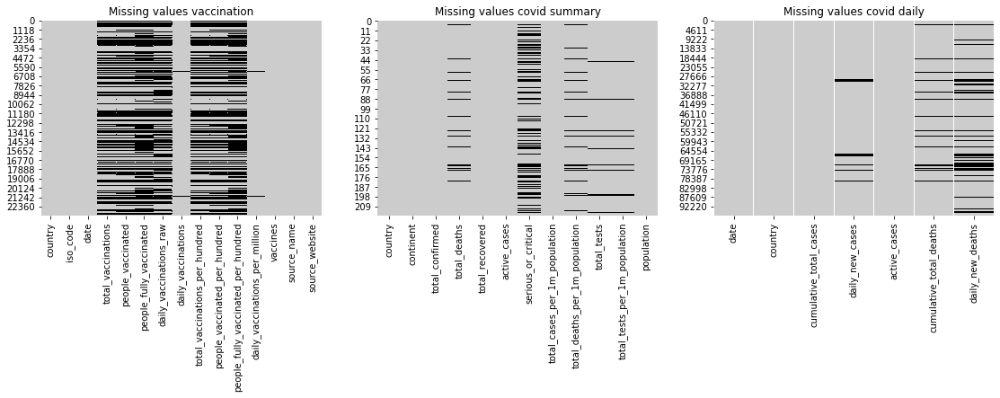

In [6]:
plt.figure(figsize=(19, 4)) # Set the size of the visualizations
plt.subplot(1, 3, 1) # Set the number of columns, rows and the position of the graph
sns.heatmap(vaccination.isnull(), cbar=False, cmap='nipy_spectral_r')
plt.title('Missing values vaccination')
plt.subplot(1, 3, 2)# Set the number of columns, rows and the position of the graph
sns.heatmap(summary_cases.isnull(), cbar=False, cmap='nipy_spectral_r')
plt.title('Missing values covid summary')        
plt.subplot(1, 3, 3)# Set the number of columns, rows and the position of the graph
sns.heatmap(daily_cases.isnull(), cbar=False, cmap='nipy_spectral_r')
plt.title('Missing values covid daily')
plt.show()

## So there are many null values present in the above 3 datasets 
### Replacing these null values with 0

In [7]:
total = summary_cases.isnull().sum().sort_values(ascending=False)
percent = (summary_cases.isnull().sum()/summary_cases.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total' , 'Percent'])
missing_data

,Total,Percent
serious_or_critical,72,0.327273
total_deaths_per_1m_population,19,0.086364
total_deaths,15,0.068182
total_tests,10,0.045455
total_tests_per_1m_population,10,0.045455
country,0,0.000000
continent,0,0.000000
total_confirmed,0,0.000000
total_recovered,0,0.000000
active_cases,0,0.000000


In [8]:
summary_cases = summary_cases.replace(np.nan,0)

In [9]:
total = daily_cases.isnull().sum().sort_values(ascending=False)
percent = (daily_cases.isnull().sum()/daily_cases.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total' , 'Percent'])
missing_data.head(20)

,Total,Percent
daily_new_deaths,19740,0.203875
daily_new_cases,6873,0.070984
cumulative_total_deaths,6600,0.068165
date,0,0.000000
country,0,0.000000
cumulative_total_cases,0,0.000000
active_cases,0,0.000000


In [10]:
daily_cases = daily_cases.replace(np.nan,0)

In [11]:
total = daily_cases.isnull().sum().sort_values(ascending=False)
percent = (vaccination.isnull().sum()/daily_cases.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total' , 'Percent'])
missing_data.head(20)

,Total,Percent
date,0.0,0.0
country,0.0,0.0
cumulative_total_cases,0.0,NaN
daily_new_cases,0.0,NaN
active_cases,0.0,NaN
cumulative_total_deaths,0.0,NaN
daily_new_deaths,0.0,NaN
daily_vaccinations,NaN,NaN
daily_vaccinations_per_million,NaN,NaN
daily_vaccinations_raw,NaN,NaN


In [12]:
vaccination = vaccination.replace(np.nan,0)

Now there are no null values left

# Combining the above dataframes into single dataframe

In [13]:
# function to easily agrregate columns
def aggregate(df: pd.Series, agg_col: str) -> pd.DataFrame:
    
    data = df.groupby("country")[agg_col].max()
    data = pd.DataFrame(data)
    
    return data

In [14]:
# define the columns we want to summarize
cols_to_summarize = ['people_vaccinated', 
                     'people_vaccinated_per_hundred', 
                     'people_fully_vaccinated', 
                     'people_fully_vaccinated_per_hundred', 
                     'total_vaccinations_per_hundred', 
                     'total_vaccinations']
cols = ['daily_new_cases','daily_new_deaths']

summary = summary_cases.set_index("country")
vaccines = vaccination[['country', 'vaccines']].drop_duplicates().set_index('country')
summary = summary.join(vaccines)
# summary = pd.merge(vaccination, daily_cases, on=['date'], how='inner')

for col in cols_to_summarize:   
    summary = summary.join(aggregate(vaccination, col))

for col in cols:   
    summary = summary.join(aggregate(daily_cases, col))
    
summary['percentage_vaccinated'] = summary.total_vaccinations / summary.population * 100
summary['tested_positive'] = summary.total_confirmed / summary.total_tests * 100

In [15]:
summary.reset_index(level=0, inplace=True)

In [16]:
summary

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,serious_or_critical,total_cases_per_1m_population,total_deaths_per_1m_population,total_tests,...,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,daily_new_cases,daily_new_deaths,percentage_vaccinated,tested_positive
0,Afghanistan,Asia,59745,2625.0,53103,4017,1124.0,1507,66.0,401964.0,...,482952.0,1.24,158343.0,0.41,1.65,641295.0,915.0,46.0,1.617464,14.863271
1,Albania,Europe,130977,2389.0,108606,19982,18.0,45554,831.0,630881.0,...,493346.0,17.14,310336.0,10.78,27.93,803682.0,1239.0,21.0,27.952261,20.760968
2,Algeria,Africa,121866,3244.0,84940,33682,20.0,2738,73.0,230861.0,...,2500000.0,5.70,0.0,0.00,5.70,2500000.0,1133.0,30.0,5.617685,52.787608
3,Andorra,Europe,13198,125.0,12650,423,24.0,170590,1616.0,193595.0,...,27613.0,35.74,8303.0,10.75,46.48,35916.0,299.0,6.0,46.422893,6.817325
4,Angola,Africa,26431,594.0,23606,2231,24.0,784,18.0,462632.0,...,740289.0,2.25,375630.0,1.14,3.40,1115919.0,355.0,9.0,3.311055,5.713180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Wallis And Futuna Islands,Australia/Oceania,444,7.0,44,393,1.0,40090,632.0,15256.0,...,NaN,NaN,NaN,NaN,NaN,NaN,63.0,2.0,NaN,2.910330
216,Western Sahara,Africa,10,1.0,8,1,0.0,16,2.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0,NaN,inf
217,Yemen,Asia,6294,1222.0,2731,2341,23.0,207,40.0,23855.0,...,196234.0,0.66,0.0,0.00,0.66,196234.0,174.0,52.0,0.646242,26.384406
218,Zambia,Africa,91533,1250.0,89852,431,45.0,4867,66.0,1394900.0,...,141829.0,0.77,5286.0,0.03,0.80,147115.0,1796.0,32.0,0.782287,6.561976


Dropping unwanted columns

In [17]:
summary = summary.drop(['serious_or_critical','total_cases_per_1m_population','total_deaths_per_1m_population','total_tests_per_1m_population'],axis=1)

In [18]:
summary.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220 entries, 0 to 219
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              220 non-null    object 
 1   continent                            220 non-null    object 
 2   total_confirmed                      220 non-null    int64  
 3   total_deaths                         220 non-null    float64
 4   total_recovered                      220 non-null    int64  
 5   active_cases                         220 non-null    int64  
 6   total_tests                          220 non-null    float64
 7   population                           220 non-null    int64  
 8   vaccines                             175 non-null    object 
 9   people_vaccinated                    175 non-null    float64
 10  people_vaccinated_per_hundred        175 non-null    float64
 11  people_fully_vaccinated         

In [19]:
summary

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,total_tests,population,vaccines,people_vaccinated,people_vaccinated_per_hundred,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,daily_new_cases,daily_new_deaths,percentage_vaccinated,tested_positive
0,Afghanistan,Asia,59745,2625.0,53103,4017,401964.0,39648172,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",482952.0,1.24,158343.0,0.41,1.65,641295.0,915.0,46.0,1.617464,14.863271
1,Albania,Europe,130977,2389.0,108606,19982,630881.0,2875195,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",493346.0,17.14,310336.0,10.78,27.93,803682.0,1239.0,21.0,27.952261,20.760968
2,Algeria,Africa,121866,3244.0,84940,33682,230861.0,44502318,"Oxford/AstraZeneca, Sputnik V",2500000.0,5.70,0.0,0.00,5.70,2500000.0,1133.0,30.0,5.617685,52.787608
3,Andorra,Europe,13198,125.0,12650,423,193595.0,77367,"Oxford/AstraZeneca, Pfizer/BioNTech",27613.0,35.74,8303.0,10.75,46.48,35916.0,299.0,6.0,46.422893,6.817325
4,Angola,Africa,26431,594.0,23606,2231,462632.0,33702820,Oxford/AstraZeneca,740289.0,2.25,375630.0,1.14,3.40,1115919.0,355.0,9.0,3.311055,5.713180
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Wallis And Futuna Islands,Australia/Oceania,444,7.0,44,393,15256.0,11075,NaN,NaN,NaN,NaN,NaN,NaN,NaN,63.0,2.0,NaN,2.910330
216,Western Sahara,Africa,10,1.0,8,1,0.0,609387,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,0.0,NaN,inf
217,Yemen,Asia,6294,1222.0,2731,2341,23855.0,30365416,Oxford/AstraZeneca,196234.0,0.66,0.0,0.00,0.66,196234.0,174.0,52.0,0.646242,26.384406
218,Zambia,Africa,91533,1250.0,89852,431,1394900.0,18805762,"Oxford/AstraZeneca, Sinopharm/Beijing",141829.0,0.77,5286.0,0.03,0.80,147115.0,1796.0,32.0,0.782287,6.561976


# VISUALISATIONS

# Correlation of Data

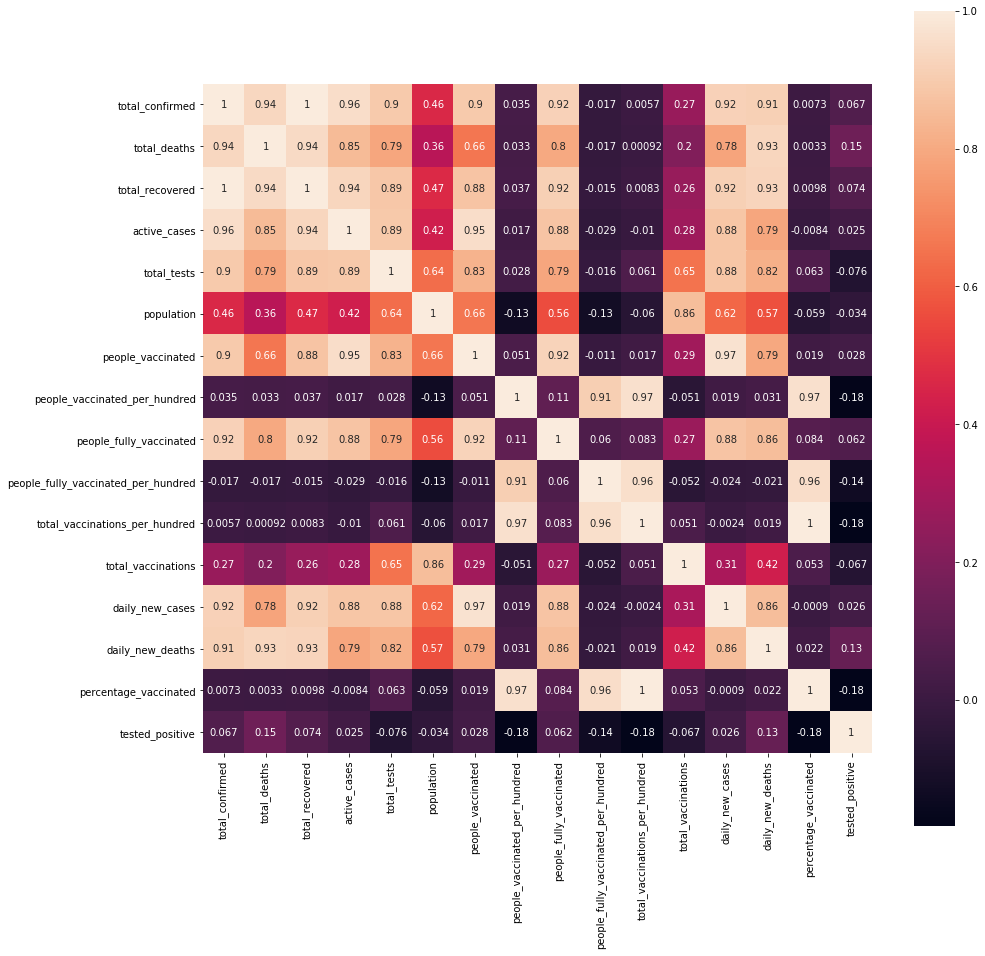

In [20]:
data = summary.reset_index().dropna(subset=['vaccines','country'])
plt.subplots(figsize=(15, 15))
sns.heatmap(summary.corr() , annot=True, square=True )
plt.show()

(array([       0.,  5000000., 10000000., 15000000., 20000000., 25000000.,
        30000000., 35000000.]),
 <a list of 8 Text yticklabel objects>)

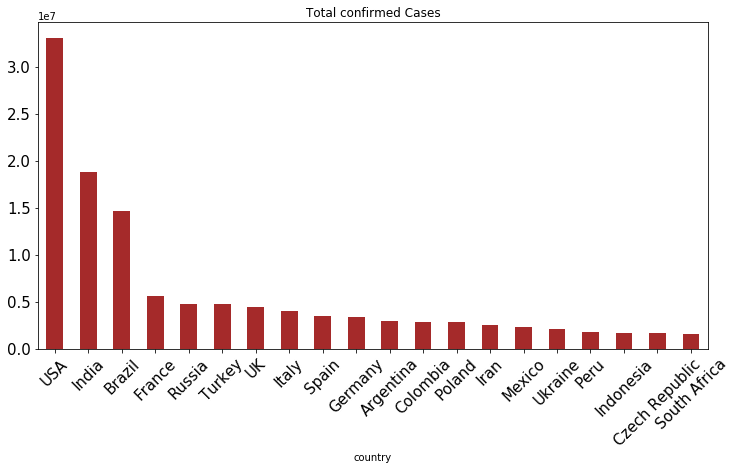

In [21]:
top_20 = summary.groupby('country')['total_confirmed'].max().sort_values(ascending = False).head(20)
top_20.plot(x='country',y=['total_confirmed'],kind = "bar",figsize = (12 , 6),color = "brown",title="Total confirmed Cases")
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

(array([      0., 1000000., 2000000., 3000000., 4000000., 5000000.,
        6000000., 7000000., 8000000.]),
 <a list of 9 Text yticklabel objects>)

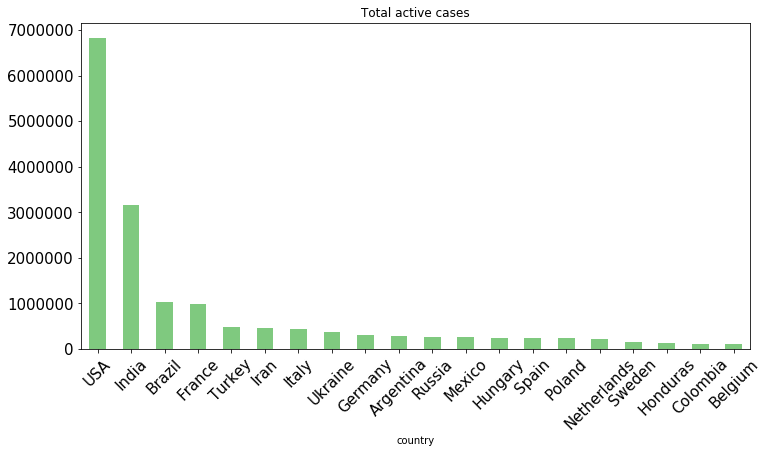

In [22]:
top_20 = summary.groupby('country')['active_cases'].max().sort_values(ascending = False).head(20)
top_20.plot(x='country',y=['active_cases'],kind = "bar",figsize = (12 , 6),colormap = "Accent",title="Total active cases")
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

(array([     0., 100000., 200000., 300000., 400000., 500000., 600000.,
        700000.]),
 <a list of 8 Text yticklabel objects>)

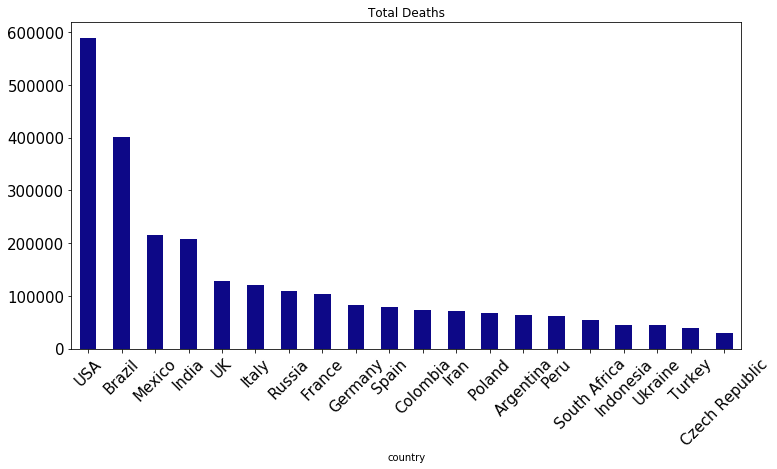

In [23]:
top_20 = summary.groupby('country')['total_deaths'].max().sort_values(ascending = False).head(20)
top_20.plot(x='country',y=['total_deaths'],kind = "bar",figsize = (12 , 6),colormap = "plasma",title="Total Deaths")
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

In [24]:
title="Death Summary"
death = summary.copy()
death['death_rate'] =  death['total_deaths']*100/death['total_confirmed']
death = death.dropna(subset=['death_rate'])
fig = px.scatter_geo(death, locations="country", color="continent",
                     locationmode='country names',
                     hover_name="country", size="death_rate",
                     projection="natural earth")
fig.update_layout(title=title, title_x=0.45)
fig.show()

(array([       0.,  5000000., 10000000., 15000000., 20000000., 25000000.,
        30000000.]),
 <a list of 7 Text yticklabel objects>)

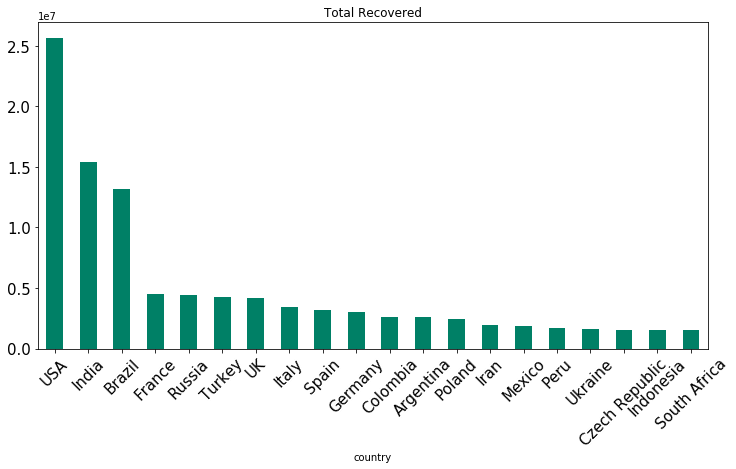

In [25]:
top_20 = summary.groupby('country')['total_recovered'].max().sort_values(ascending = False).head(20)
top_20.plot(x='country',y=['total_recovered'],kind = "bar",figsize = (12 , 6),colormap = "summer",title="Total Recovered")
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

(array([       0.,  5000000., 10000000., 15000000., 20000000., 25000000.,
        30000000., 35000000.]),
 <a list of 8 Text yticklabel objects>)

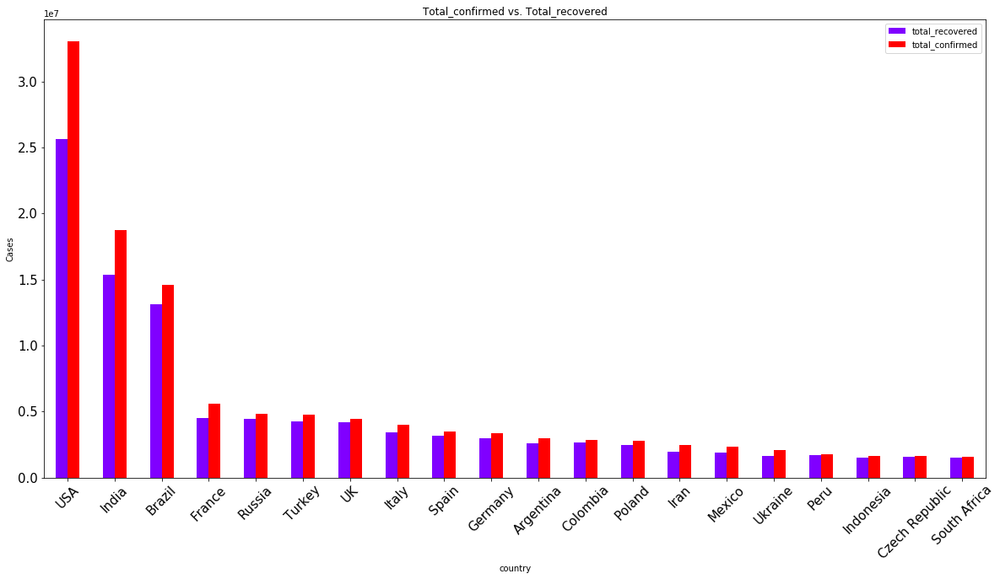

In [26]:
top_20 = summary.sort_values('total_confirmed',ascending = False).head(20)
top_20.plot(x='country',y=['total_recovered','total_confirmed'],kind = "bar",figsize = (20 , 10),ylabel="Cases",
            title = "Total_confirmed vs. Total_recovered",colormap='rainbow')
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

(array([       0.,  5000000., 10000000., 15000000., 20000000., 25000000.,
        30000000.]),
 <a list of 7 Text yticklabel objects>)

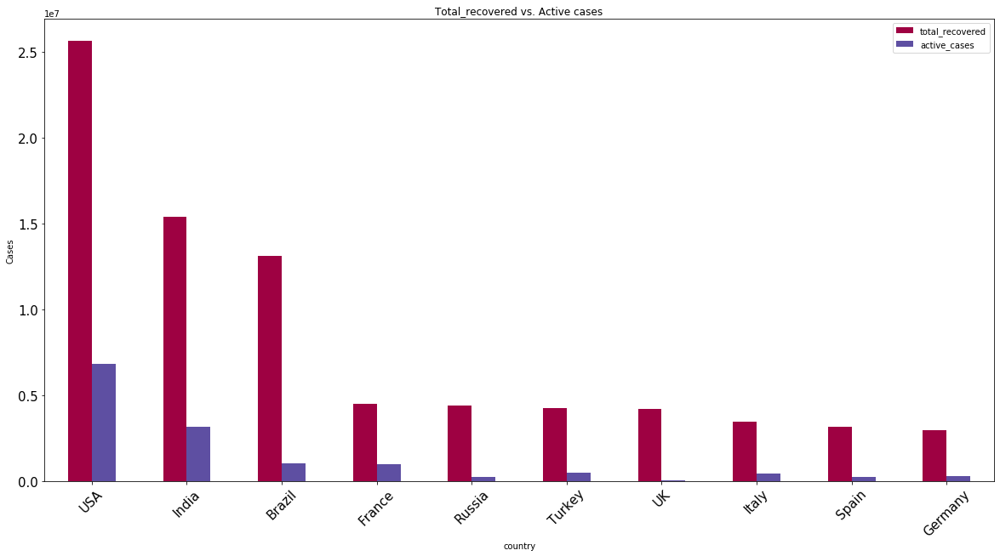

In [27]:
top_20 = summary.sort_values('total_recovered',ascending = False).head(10)
top_20.plot(x='country',y=['total_recovered','active_cases'],kind = "bar",figsize = (20 , 10),ylabel="Cases"
            ,title = "Total_recovered vs. Active cases",colormap='Spectral')
plt.xticks(fontsize=15, rotation=45)
plt.yticks(fontsize=15)

In [28]:
rise=pd.DataFrame(daily_cases.groupby('date')['daily_new_cases'].sum())
rise = rise.reset_index()
fig = px.bar(rise, x='date', y='daily_new_cases',width=700, height=400)
fig.show()

In [29]:
fig = px.line(daily_cases, x="date", y="daily_new_cases", color='country',title= "Daily rise in cases")
fig.show()

# Highest Number of people vaccinated(Fully & one dose) countrywise

In [30]:
fully=summary.groupby('country')['people_vaccinated','people_fully_vaccinated'].max().sort_values(by='people_vaccinated',ascending = False).head(20)
fully['total'] = fully['people_vaccinated'] + fully['people_fully_vaccinated']

fully

,people_vaccinated,people_fully_vaccinated,total
country,,,
India,188363894.0,45317035.0,233680929.0
Brazil,51055813.0,23485276.0,74541089.0
Germany,38245152.0,18187186.0,56432338.0
France,28310571.0,12906685.0,41217256.0
Italy,26989197.0,13338891.0,40328088.0
Mexico,24224273.0,14193288.0,38417561.0
Canada,23670710.0,3184937.0,26855647.0
Spain,20048174.0,11260175.0,31308349.0
Indonesia,18260482.0,11356025.0,29616507.0


In [31]:
fully.reset_index(level=0, inplace=True)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]),
 <a list of 20 Text xticklabel objects>)

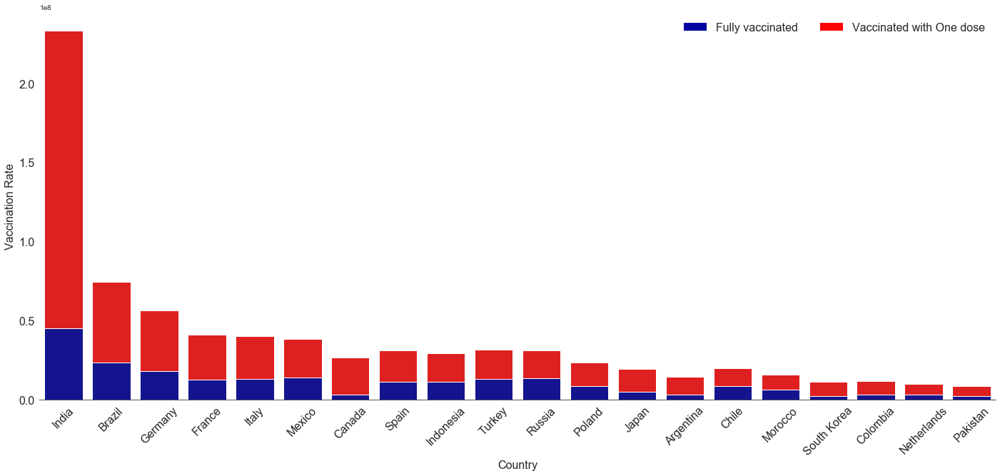

In [32]:
sns.set_style("white")
sns.set_context({"figure.figsize": (24, 10)})
img = plt.imread("vaccination.jpg")
sns.barplot(x = fully['country'], y = fully['total'], color = "red")

bottom_plot = sns.barplot(x = fully['country'], y = fully['people_fully_vaccinated'], color = "#0000A3")


topbar = plt.Rectangle((0,0),1,1,fc="red", edgecolor = 'none')
bottombar = plt.Rectangle((0,0),1,1,fc='#0000A3',  edgecolor = 'none')
l = plt.legend([bottombar, topbar], ['Fully vaccinated', 'Vaccinated with One dose'], loc=1, ncol = 2, prop={'size':16})
l.draw_frame(False)

sns.despine(left=True)
bottom_plot.set_ylabel("Vaccination Rate")
bottom_plot.set_xlabel("Country")

for item in ([bottom_plot.xaxis.label, bottom_plot.yaxis.label] +
             bottom_plot.get_xticklabels() + bottom_plot.get_yticklabels()):
    item.set_fontsize(16)
    
plt.xticks(rotation=45)
# plt.update_layout(img)
# plt.imshow(img, zorder=0, extent=[0.5, 8.0, 1.0, 7.0])

## Percentage of people full vaccinated and people vaccinated for only one dose

In [33]:
summary['per_one_dose'] = summary.people_vaccinated / summary.population * 100
summary['full_vaccinated'] = summary.people_fully_vaccinated / summary.population * 100
summary

,country,continent,total_confirmed,total_deaths,total_recovered,active_cases,total_tests,population,vaccines,people_vaccinated,...,people_fully_vaccinated,people_fully_vaccinated_per_hundred,total_vaccinations_per_hundred,total_vaccinations,daily_new_cases,daily_new_deaths,percentage_vaccinated,tested_positive,per_one_dose,full_vaccinated
0,Afghanistan,Asia,59745,2625.0,53103,4017,401964.0,39648172,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",482952.0,...,158343.0,0.41,1.65,641295.0,915.0,46.0,1.617464,14.863271,1.218094,0.399370
1,Albania,Europe,130977,2389.0,108606,19982,630881.0,2875195,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ...",493346.0,...,310336.0,10.78,27.93,803682.0,1239.0,21.0,27.952261,20.760968,17.158697,10.793564
2,Algeria,Africa,121866,3244.0,84940,33682,230861.0,44502318,"Oxford/AstraZeneca, Sputnik V",2500000.0,...,0.0,0.00,5.70,2500000.0,1133.0,30.0,5.617685,52.787608,5.617685,0.000000
3,Andorra,Europe,13198,125.0,12650,423,193595.0,77367,"Oxford/AstraZeneca, Pfizer/BioNTech",27613.0,...,8303.0,10.75,46.48,35916.0,299.0,6.0,46.422893,6.817325,35.690928,10.731966
4,Angola,Africa,26431,594.0,23606,2231,462632.0,33702820,Oxford/AstraZeneca,740289.0,...,375630.0,1.14,3.40,1115919.0,355.0,9.0,3.311055,5.713180,2.196519,1.114536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
215,Wallis And Futuna Islands,Australia/Oceania,444,7.0,44,393,15256.0,11075,NaN,NaN,...,NaN,NaN,NaN,NaN,63.0,2.0,NaN,2.910330,NaN,NaN
216,Western Sahara,Africa,10,1.0,8,1,0.0,609387,NaN,NaN,...,NaN,NaN,NaN,NaN,3.0,0.0,NaN,inf,NaN,NaN
217,Yemen,Asia,6294,1222.0,2731,2341,23855.0,30365416,Oxford/AstraZeneca,196234.0,...,0.0,0.00,0.66,196234.0,174.0,52.0,0.646242,26.384406,0.646242,0.000000
218,Zambia,Africa,91533,1250.0,89852,431,1394900.0,18805762,"Oxford/AstraZeneca, Sinopharm/Beijing",141829.0,...,5286.0,0.03,0.80,147115.0,1796.0,32.0,0.782287,6.561976,0.754178,0.028108


In [34]:
full = summary.groupby('country')['full_vaccinated'].max().sort_values(ascending = False).head(50)
one_dose = summary.groupby('country')['per_one_dose'].max().sort_values(ascending = False).head(50)

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 <a list of 8 Text yticklabel objects>)

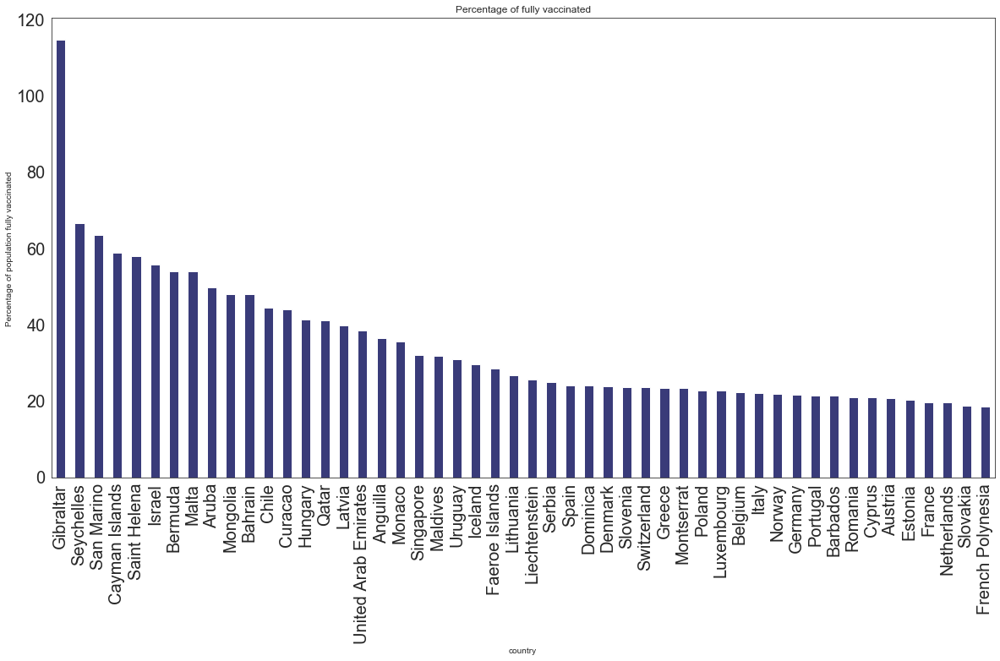

In [35]:
full.plot(x='country',y=['full'],kind = "bar",figsize = (20 , 10),ylabel="Percentage of population fully vaccinated "
            ,title = "Percentage of fully vaccinated",colormap='tab20b')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

(array([  0.,  20.,  40.,  60.,  80., 100., 120., 140.]),
 <a list of 8 Text yticklabel objects>)

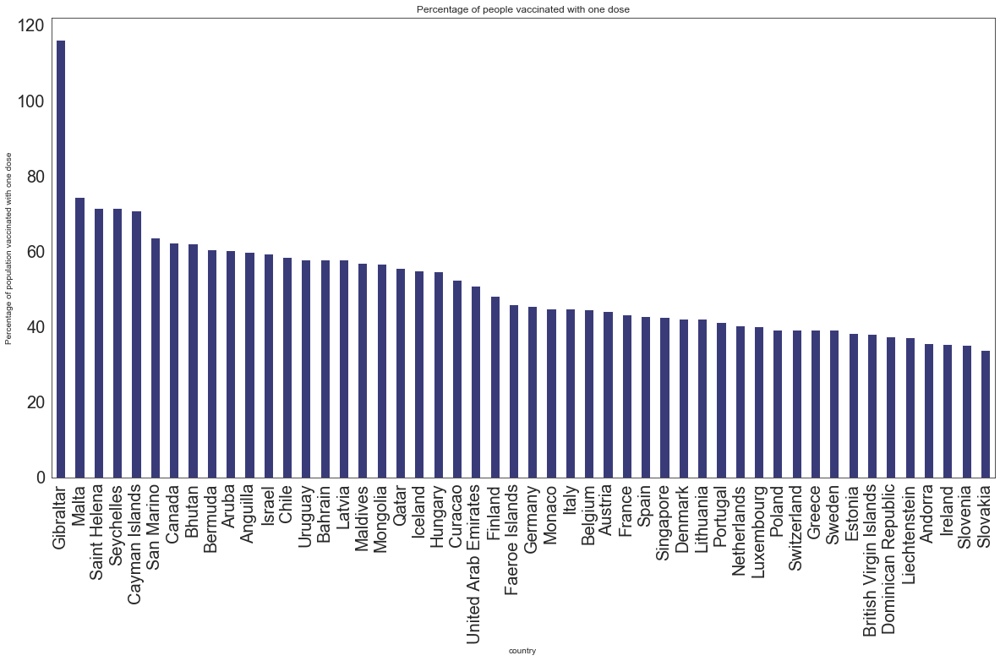

In [36]:
one_dose.plot(x='country',kind = "bar",figsize = (20 , 10),ylabel="Percentage of population vaccinated with one dose"
            ,title = "Percentage of people vaccinated with one dose",colormap='tab20b')
plt.xticks(fontsize=20, rotation=90)
plt.yticks(fontsize=20)

# Vaccine brands used

In [37]:
pd.DataFrame(summary.groupby("country")[["vaccines"]].max())

,vaccines
country,
Afghanistan,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm..."
Albania,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinovac, ..."
Algeria,"Oxford/AstraZeneca, Sputnik V"
Andorra,"Oxford/AstraZeneca, Pfizer/BioNTech"
Angola,Oxford/AstraZeneca
...,...
Wallis And Futuna Islands,NaN
Western Sahara,NaN
Yemen,Oxford/AstraZeneca


In [38]:
daily = vaccination.loc[:,['country', 'date', 'vaccines', 'daily_vaccinations']].dropna(subset=['daily_vaccinations'])
daily["date"] = pd.to_datetime(daily["date"], format = '%Y-%m-%d')

daily_agg = daily.groupby('country').daily_vaccinations.agg(
    sum_vaccination_amt  = 'sum',
    mean_vaccination_amt = 'mean')



full_daily = daily.merge(daily_agg, on = 'country')
full_daily

,country,date,vaccines,daily_vaccinations,sum_vaccination_amt,mean_vaccination_amt
0,Afghanistan,2021-02-22,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",0.0,638537.0,5967.635514
1,Afghanistan,2021-02-23,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",1367.0,638537.0,5967.635514
2,Afghanistan,2021-02-24,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",1367.0,638537.0,5967.635514
3,Afghanistan,2021-02-25,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",1367.0,638537.0,5967.635514
4,Afghanistan,2021-02-26,"Oxford/AstraZeneca, Pfizer/BioNTech, Sinopharm...",1367.0,638537.0,5967.635514
...,...,...,...,...,...,...
23463,Zimbabwe,2021-06-03,Sinopharm/Beijing,13588.0,1055582.0,9596.200000
23464,Zimbabwe,2021-06-04,Sinopharm/Beijing,11349.0,1055582.0,9596.200000
23465,Zimbabwe,2021-06-05,Sinopharm/Beijing,8498.0,1055582.0,9596.200000
23466,Zimbabwe,2021-06-06,Sinopharm/Beijing,8019.0,1055582.0,9596.200000


In [39]:
vaccines = summary.loc[:,['country', 'vaccines']]
vaccines = vaccines.groupby('vaccines')['country'].unique()
vaccines = pd.DataFrame(vaccines).reset_index()
vaccines

,vaccines,country
0,"Abdala, Soberana02",[Cuba]
1,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[Chile]
2,"CanSino, Oxford/AstraZeneca, Pfizer/BioNTech, ...",[Mexico]
3,"CanSino, Oxford/AstraZeneca, Sinopharm/Beijing...",[Pakistan]
4,"CanSino, Sinopharm/Beijing, Sinopharm/Wuhan, S...",[China]
5,"Covaxin, Oxford/AstraZeneca","[Central African Republic, India]"
6,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing","[Comoros, Mauritius]"
7,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[Paraguay]
8,"Covaxin, Oxford/AstraZeneca, Sinopharm/Beijing...",[Iran]
9,"EpiVacCorona, Sputnik V",[Russia]


In [40]:
title = "Popular Vaccines"
data = full_daily
fig = px.choropleth(data, 
            locations="country", 
            locationmode='country names',
            color="vaccines", 
            hover_name="country", 
                   )


fig.update_layout(title=title, 
            title_x=0.5,
            legend_orientation = 'h'
)
fig.show()

# Analysis for India

In [41]:
india = daily_cases[daily_cases['country']=='India']
# fig = px.bar(india, x='date', y='daily_new_cases',title='Daily new cases from Apr 2020 to Apr 2021',width=700, height=400)
# fig.show()

# vaccine_brz=vaccine[vaccine['country']=='Brazil']
fig = make_subplots(rows=2, cols=1,subplot_titles=('Active Cases','Daily New Deaths'))

fig.add_trace(go.Bar(x=india['date'].values, y=india['active_cases'].values,showlegend=False),
              row=1, col=1)

fig.add_trace(go.Bar(x=india['date'].values, y=india['daily_new_deaths'].values,showlegend=False),
              row=2, col=1)

# fig.add_trace(go.Scatter(x=india['date'].values, y=vaccine_ind['daily_vaccinations'].values,showlegend=False, fill='tozeroy',
#                     mode='none'),
#               row=3, col=1)
fig.update_layout(height=800, width=700)
fig.show()

Text(0.5, 0, 'Daily Vaccinations(x1000)')

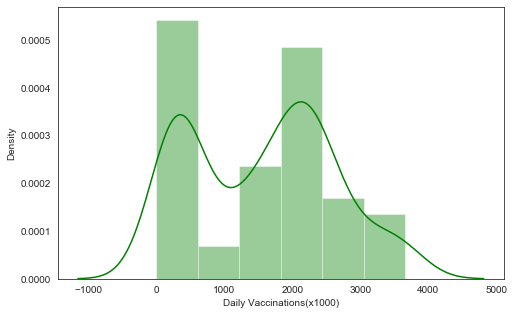

In [42]:
df = vaccination[vaccination['country']=='India']
plt.figure(figsize=(8,5))
sns.distplot(df.daily_vaccinations/1000, kde=True, color='green')
plt.xlabel('Daily Vaccinations(x1000)')

([<matplotlib.axis.XTick at 0xdd445b0>,
 <a list of 30 Text xticklabel objects>)

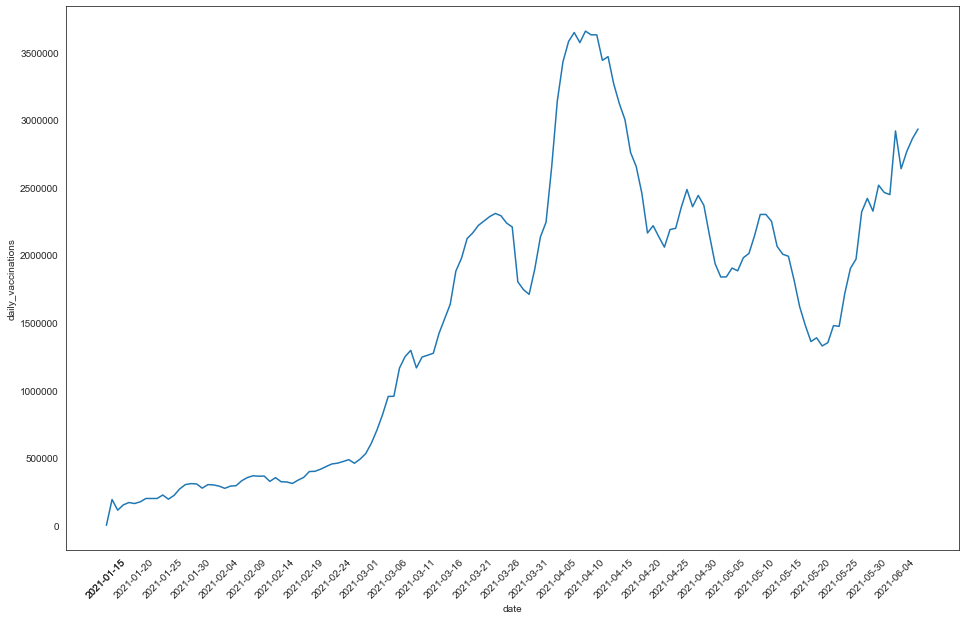

In [43]:
plt.figure(figsize=(16,10))
sns.lineplot(df.date, df.daily_vaccinations)
locs, labels = plt.xticks()
x_labels = [x for x in range(len(labels)) if x%5==0] + [0]
plt.xticks(x_labels, rotation='45')

In [44]:
summary = vaccination[vaccination['country']=='India']
combine = pd.merge(india,summary, on = "country")

<Figure size 1080x864 with 0 Axes>

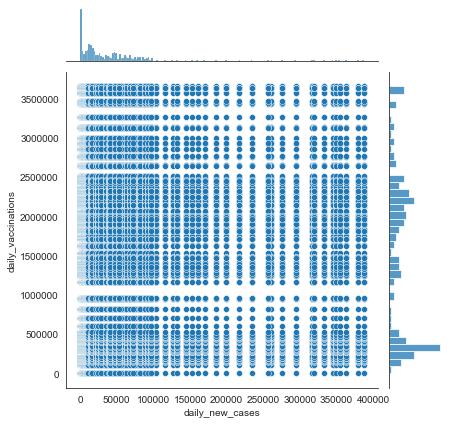

In [45]:
plt.figure(figsize=(15,12))
sns.jointplot(x="daily_new_cases", y="daily_vaccinations", data=combine)

plt.show()

# Overall summary for India

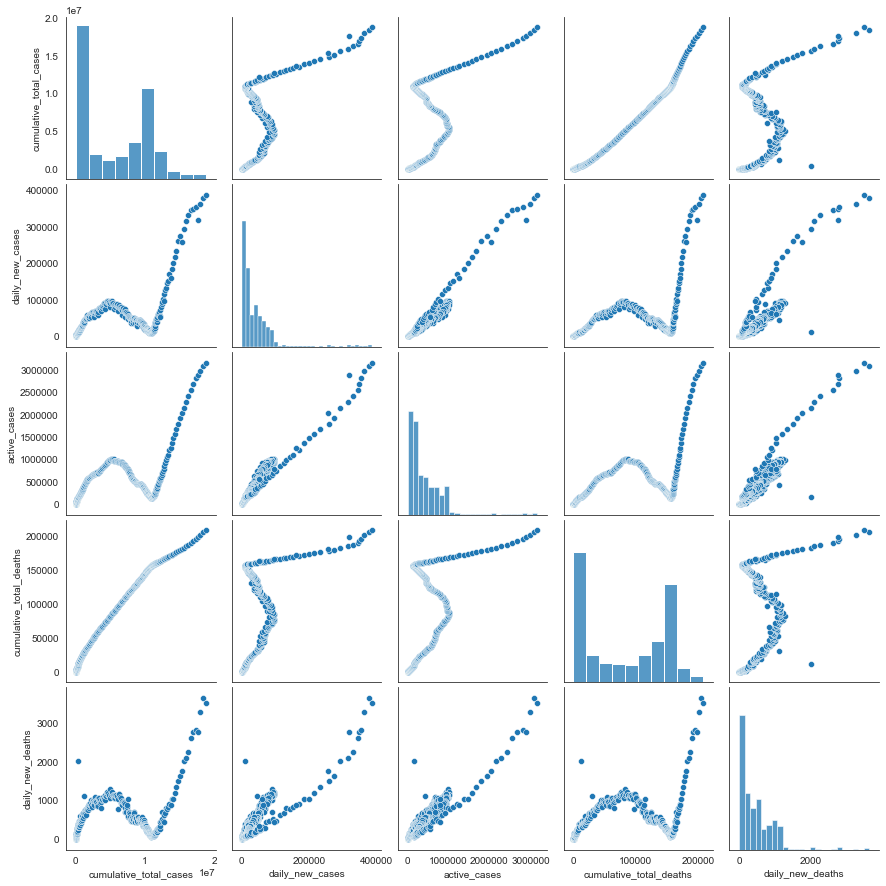

In [46]:
sns.pairplot(india)